### Setup Environment:

In [1]:
from src.get_dataset import get_dataset, split_data
from src.data_loader import BRSETDataset, process_labels
from src.RetFound import get_retfound
from src.FocalLoss import FocalLoss
from src.model import FoundationalCVModel, FoundationalCVModelWithClassifier
from sklearn.utils.class_weight import compute_class_weight

import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader

from src.train import train
from src.test import test

In [2]:
# Constants:
DATASET = '/home/opc/Retina/BRSET/'
LABELS_PATH = os.path.join(DATASET, 'labels.csv')
IMAGES = os.path.join(DATASET, 'images/')
DOWNLOAD = False
SHAPE = (224, 224)
LABEL = 'DR_ICDR'
IMAGE_COL = 'image_id'
TEST_SIZE = 0.3
UNDERSAMPLE = False

"""
Dataset Mean and Std:
NORM_MEAN = [0.5896205017400412, 0.29888971649817453, 0.1107679405196557]
NORM_STD = [0.28544273712830986, 0.15905456049750208, 0.07012281660980953]

ImageNet Mean and Std:
NORM_MEAN = [0.485, 0.456, 0.406]
NORM_STD = [0.229, 0.224, 0.225]
"""

NORM_MEAN = None # [0.485, 0.456, 0.406]
NORM_STD = None # [0.229, 0.224, 0.225]

BACKBONE = 'convnextv2_base'
MODE = 'fine_tune'
backbone_mode= 'eval' # 'fine_tune'

HIDDEN = [128]
num_classes = 3

BATCH_SIZE = 16
NUM_WORKERS = 4

LOSS = None #'focal_loss'
OPTIMIZER = 'adam'

# Define your hyperparameters
num_epochs = 50
learning_rate = 1e-5

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


#### Read csv file:

In [3]:
df = get_dataset(DATASET, download=DOWNLOAD, info=False)
df.head()

loading csv file in /home/opc/Retina/BRSET//labels.csv


,image_id,patient_id,camera,patient_age,comorbidities,diabetes_time_y,insuline,patient_sex,exam_eye,diabetes,...,vascular_occlusion,hypertensive_retinopathy,drusens,hemorrhage,retinal_detachment,myopic_fundus,increased_cup_disc,other,quality,normality
0,img00001,1,Canon CR,48.0,diabetes1,12,yes,1,1,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
1,img00002,1,Canon CR,48.0,diabetes1,12,yes,1,2,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
2,img00003,2,Canon CR,18.0,diabetes1,7,yes,2,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
3,img00004,2,Canon CR,18.0,diabetes1,7,yes,2,2,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
4,img00005,3,Canon CR,22.0,diabetes1,11,yes,1,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal


In [4]:
# Convert into 3 classes:

# Normal = 0; Non-proliferative = 1, 2, 3; Proliferative = 4
# Map values to categories
df[LABEL] = df[LABEL].apply(lambda x: 'Normal' if x == 0 else ('Non-proliferative' if x in [1, 2, 3] else 'Proliferative'))

Train data shape: (11386, 35)
Test data shape: (4880, 35)


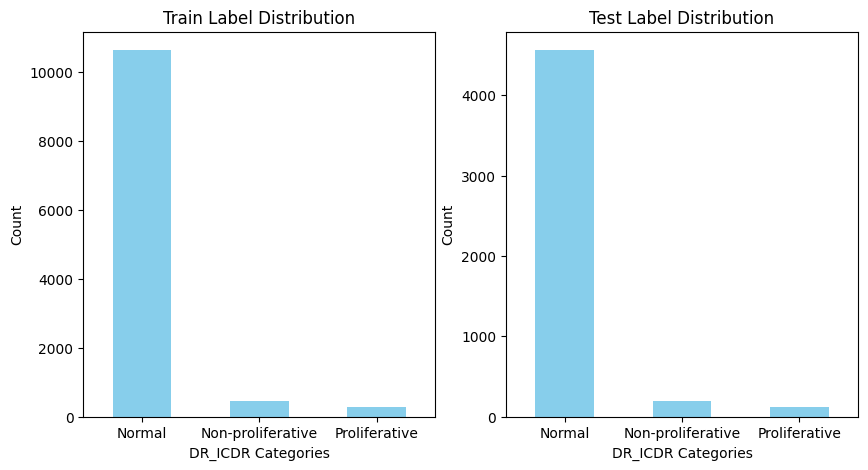

Getting validation set...
Train data shape: (10247, 35)
Test data shape: (1139, 35)


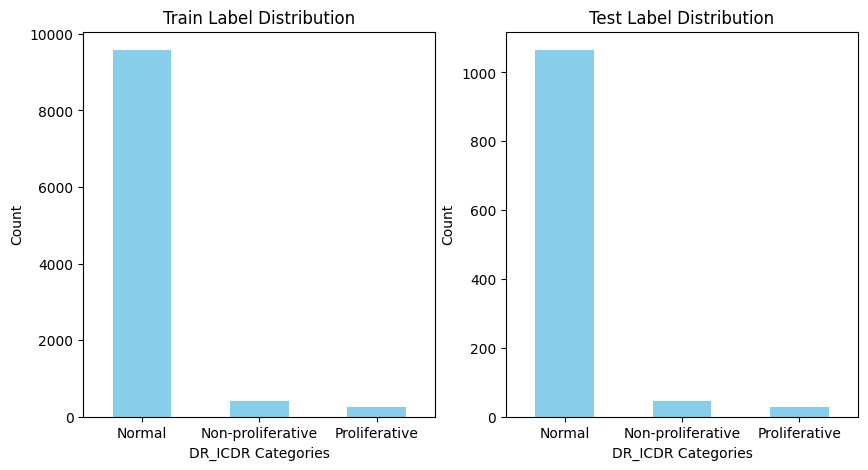

In [5]:
# Split dataset into train, test and validation:
df_train, df_test = split_data(df, LABEL, TEST_SIZE, undersample=False)
print('Getting validation set...')
df_train, df_val = split_data(df_train, LABEL, 0.10)

### Dataloaders

In [6]:
# Train the one hot encoder on the train set and get the labels for the test and validation sets:
train_labels, mlb, train_columns = process_labels(df_train, col=LABEL)

In [7]:
# Define the target image shape

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(SHAPE),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(50),  # Randomly rotate the image by up to 10 degrees
])

if NORM_MEAN is not None and NORM_STD is not None:
    train_transforms.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

test_transform = transforms.Compose([
    transforms.Resize(SHAPE),
    transforms.ToTensor(),
])

if NORM_MEAN is not None and NORM_STD is not None:
    test_transform.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

In [8]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

In [9]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

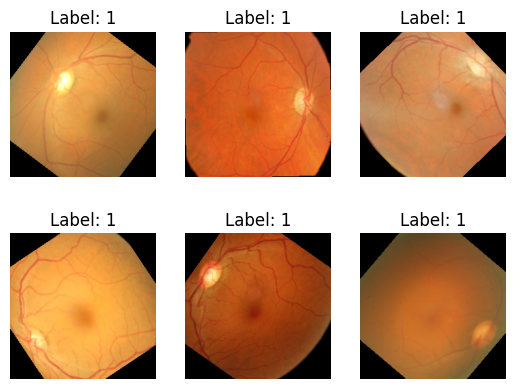

In [10]:
# Print 6 samples with their labels
# Iterate through the DataLoader and plot the images with labels

for batch in train_dataloader:

    images, labels = batch['image'], batch['labels']

    for i in range(len(images)):
        if i == 6:
            break
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i].permute(1, 2, 0))  # Permute to (H, W, C) from (C, H, W)
        plt.title(f"Label: {np.argmax(labels[i])}")
        plt.axis('off')
    plt.show()
    break

### Model

In [11]:
# Create a DataLoader to generate embeddings
#model = get_retfound(weights='/home/opc/FoundationalRetina/Weights/RETFound_cfp_weights.pth', num_classes=3)
# Create a DataLoader to generate embeddings
backbone_model = FoundationalCVModel(backbone=BACKBONE, mode=MODE)
model = FoundationalCVModelWithClassifier(backbone_model, hidden=HIDDEN, num_classes=num_classes, mode=MODE, backbone_mode=backbone_mode)
model.to(device)

# Use DataParallel to parallelize the model across multiple GPUs
if torch.cuda.device_count() > 1:
    print("Using", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model, [0,1])

Using 2 GPUs!


### Training:

In [12]:
if LOSS == 'focal_loss':
    class_distribution = train_dataloader.dataset.labels.sum(axis=0)
    print(f'Class distribution: {class_distribution}')
    class_dis = np.array(class_distribution)
    class_weights =1-class_dis/np.sum(class_dis)
    weights = torch.tensor(class_weights).to(device)
    #criterion = FocalLoss()  # Focal Loss
    criterion = FocalLoss(gamma=2, alpha=weights)
else:
    # Assuming train_loader.dataset.labels is a one-hot representation
    class_indices = np.argmax(train_dataloader.dataset.labels, axis=1)

    # Compute class weights using class indices
    class_weights = compute_class_weight('balanced', classes=np.unique(class_indices), y=class_indices)
    class_weights = torch.tensor(class_weights, dtype=torch.float32)
    criterion = nn.CrossEntropyLoss(weight=class_weights).to(device)
    #criterion = nn.BCEWithLogitsLoss() # Binary Cross-Entropy Loss

if OPTIMIZER == 'adam':
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
elif OPTIMIZER == 'adamw':
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
else:
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

In [13]:
model = train(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=num_epochs, save=True, device=device, backbone=f'convnextv2_3class_{LABEL}')

100%|██████████| 72/72 [00:20<00:00,  3.56it/s]


Epoch 1, Train Loss: 1.053768591092269, Val Loss: 1.2125858945979013, F1 Score: 0.11165383723316537


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 2, Train Loss: 0.9456354404760411, Val Loss: 1.138885773304436, F1 Score: 0.26619286374808765


100%|██████████| 72/72 [00:20<00:00,  3.51it/s]


Epoch 3, Train Loss: 0.9307045234997819, Val Loss: 0.8984145306878619, F1 Score: 0.3204989061450692


100%|██████████| 72/72 [00:20<00:00,  3.52it/s]


Epoch 4, Train Loss: 0.8746090293535018, Val Loss: 0.9082301354242696, F1 Score: 0.370197357415237


100%|██████████| 72/72 [00:20<00:00,  3.52it/s]


Epoch 5, Train Loss: 0.8248532610406369, Val Loss: 0.776250657522016, F1 Score: 0.5201183866907334


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 6, Train Loss: 0.8033642979940274, Val Loss: 0.9554878920316696, F1 Score: 0.3731735581484619


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 7, Train Loss: 0.7636625522430899, Val Loss: 0.9027102041161723, F1 Score: 0.46597508041349145


100%|██████████| 72/72 [00:20<00:00,  3.50it/s]


Epoch 8, Train Loss: 0.7733867958350784, Val Loss: 0.8319022587190071, F1 Score: 0.5222237404150799


100%|██████████| 72/72 [00:20<00:00,  3.50it/s]


Epoch 9, Train Loss: 0.7462983621217532, Val Loss: 0.7319814978788296, F1 Score: 0.5945518717219671


100%|██████████| 72/72 [00:20<00:00,  3.53it/s]


Epoch 10, Train Loss: 0.7436590198072925, Val Loss: 0.7150641632162862, F1 Score: 0.583885640025991


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 11, Train Loss: 0.7004766202358857, Val Loss: 0.814641470917397, F1 Score: 0.5879150827864965


100%|██████████| 72/72 [00:20<00:00,  3.46it/s]


Epoch 12, Train Loss: 0.6750644836197033, Val Loss: 0.8282444715085957, F1 Score: 0.6105697732701132


100%|██████████| 72/72 [00:20<00:00,  3.54it/s]


Epoch 13, Train Loss: 0.6644284421703001, Val Loss: 0.8312708539888263, F1 Score: 0.5944142563907295


100%|██████████| 72/72 [00:20<00:00,  3.47it/s]


Epoch 14, Train Loss: 0.7223155302650843, Val Loss: 0.7653669932236274, F1 Score: 0.5325887079106923


100%|██████████| 72/72 [00:20<00:00,  3.54it/s]


Epoch 15, Train Loss: 0.6767838675290485, Val Loss: 0.7016038085437484, F1 Score: 0.6335740070917519


100%|██████████| 72/72 [00:20<00:00,  3.54it/s]


Epoch 16, Train Loss: 0.6443915037138972, Val Loss: 0.6550968937161896, F1 Score: 0.6704042134653214


100%|██████████| 72/72 [00:20<00:00,  3.45it/s]


Epoch 17, Train Loss: 0.6333109979835948, Val Loss: 0.6907818257394764, F1 Score: 0.5220363676746224


100%|██████████| 72/72 [00:20<00:00,  3.49it/s]


Epoch 18, Train Loss: 0.5734194025002106, Val Loss: 0.6744800101344784, F1 Score: 0.6893907838509126


100%|██████████| 72/72 [00:20<00:00,  3.50it/s]


Epoch 19, Train Loss: 0.5499561102639494, Val Loss: 0.5314294949380888, F1 Score: 0.7233347524233692


100%|██████████| 72/72 [00:20<00:00,  3.55it/s]


Epoch 20, Train Loss: 0.5181909325458516, Val Loss: 0.6270919143118792, F1 Score: 0.6702348535254479


100%|██████████| 72/72 [00:20<00:00,  3.51it/s]


Epoch 21, Train Loss: 0.5027658708812015, Val Loss: 0.6605354439881113, F1 Score: 0.7045173649734272


100%|██████████| 72/72 [00:20<00:00,  3.53it/s]


Epoch 22, Train Loss: 0.48617363108580647, Val Loss: 0.5483337527968817, F1 Score: 0.6871440593060472


100%|██████████| 72/72 [00:20<00:00,  3.43it/s]


Epoch 23, Train Loss: 0.45722901946668876, Val Loss: 0.7020111187464662, F1 Score: 0.6719633610424834


100%|██████████| 72/72 [00:20<00:00,  3.44it/s]


Epoch 24, Train Loss: 0.45768926632641443, Val Loss: 0.5797665604493685, F1 Score: 0.6848259530136902


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 25, Train Loss: 0.4136547598284604, Val Loss: 0.5747170671820641, F1 Score: 0.714632699538058


100%|██████████| 72/72 [00:20<00:00,  3.48it/s]


Epoch 26, Train Loss: 0.38939531669369354, Val Loss: 0.5417414315872722, F1 Score: 0.7223154746293536
Early stopping triggered.


### Test

100%|██████████| 305/305 [01:25<00:00,  3.57it/s]


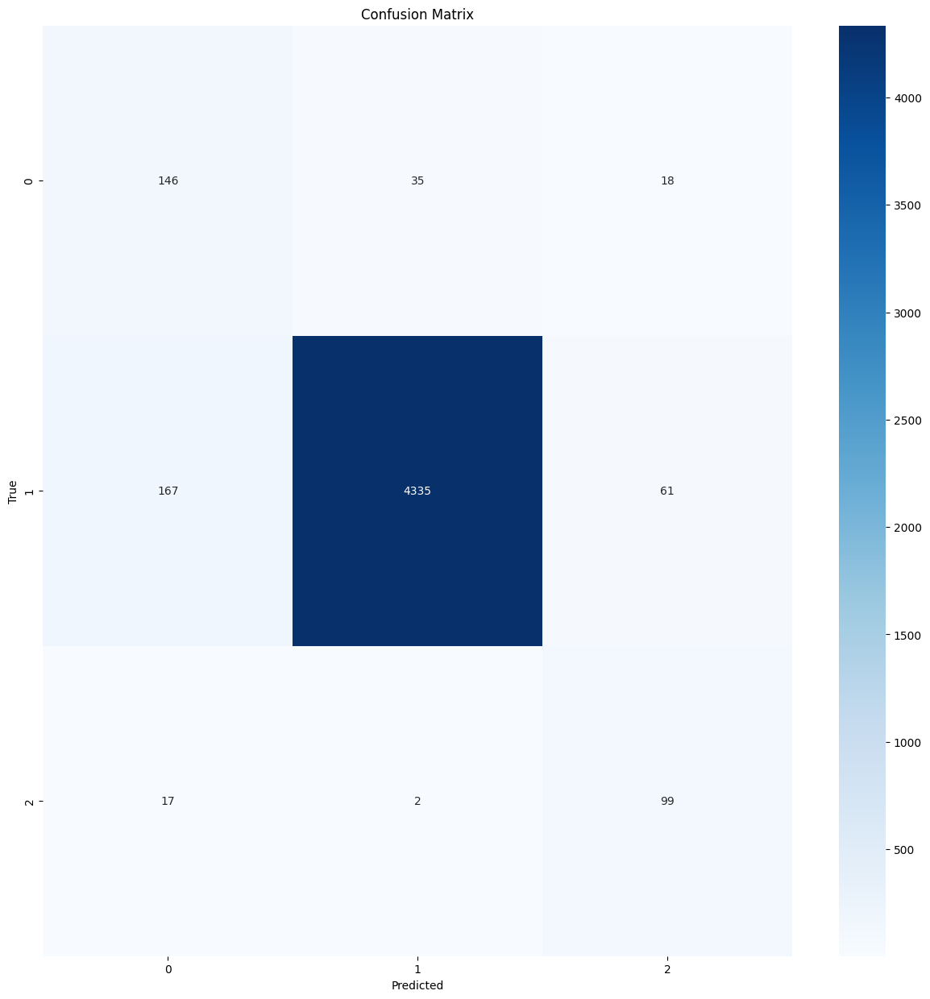

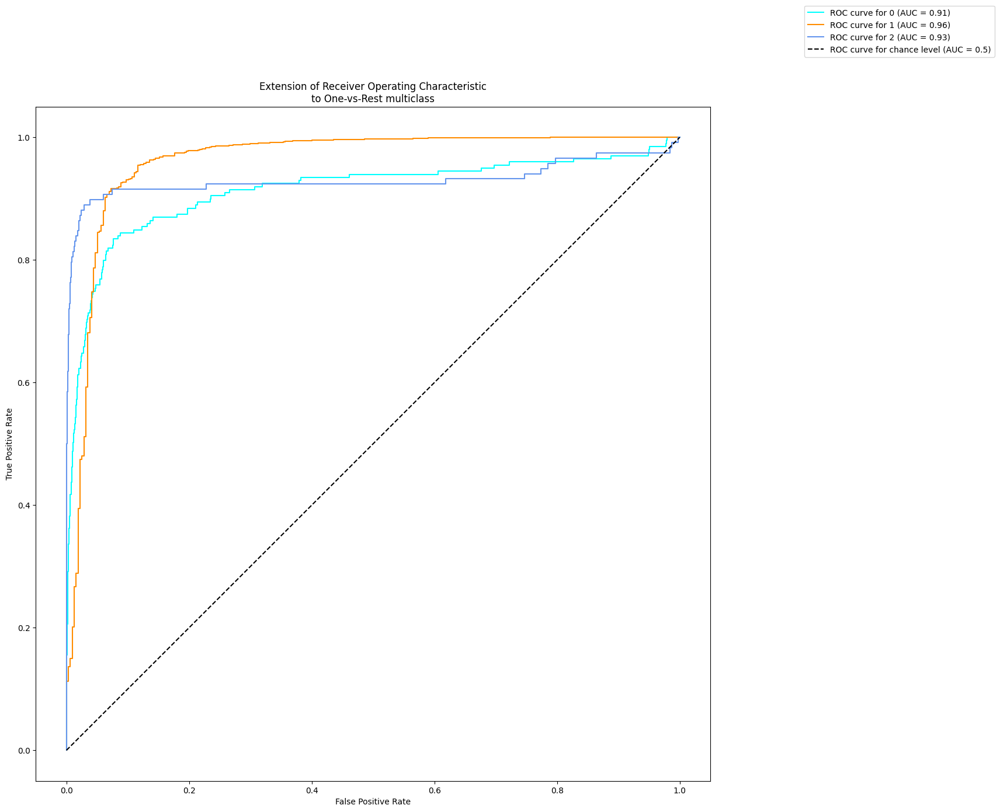

              precision    recall  f1-score   support

           0       0.44      0.73      0.55       199
           1       0.99      0.95      0.97      4563
           2       0.56      0.84      0.67       118

    accuracy                           0.94      4880
   macro avg       0.66      0.84      0.73      4880
weighted avg       0.96      0.94      0.95      4880

##################################################  Saliency Maps  ##################################################

Class 0:


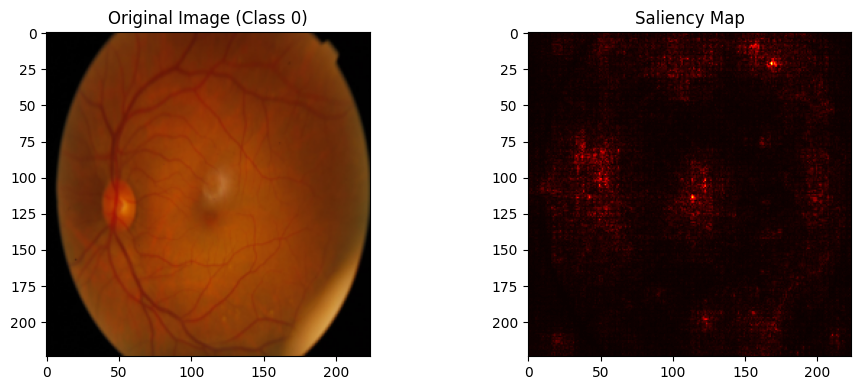

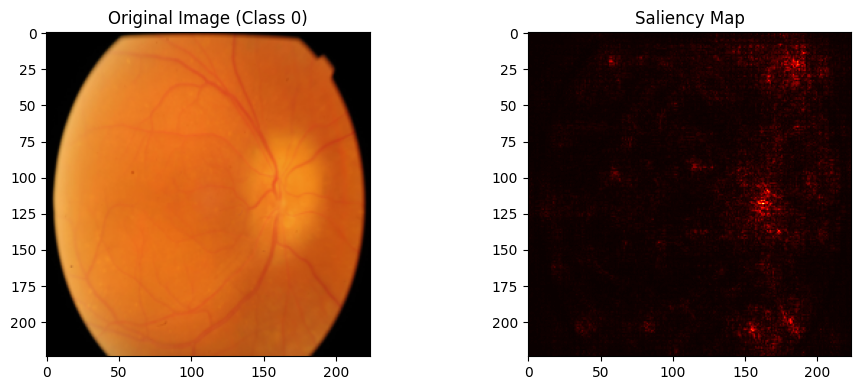

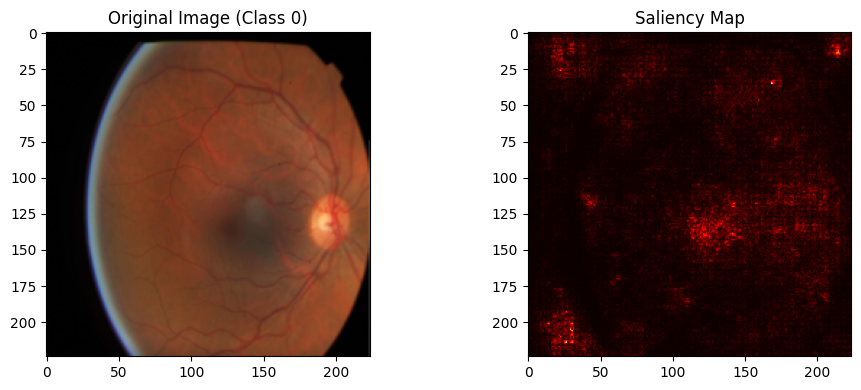

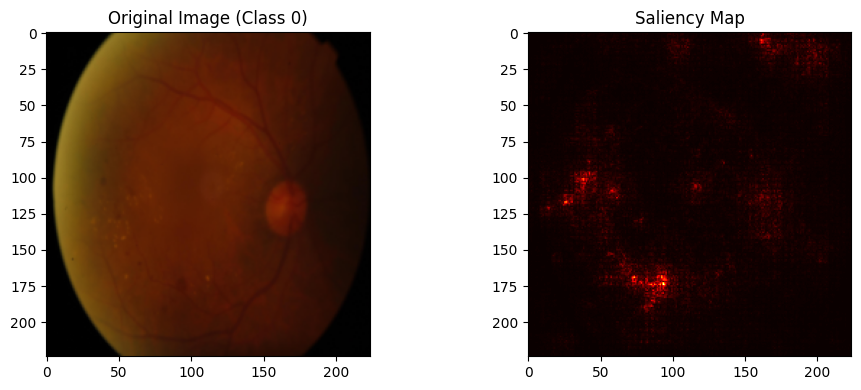

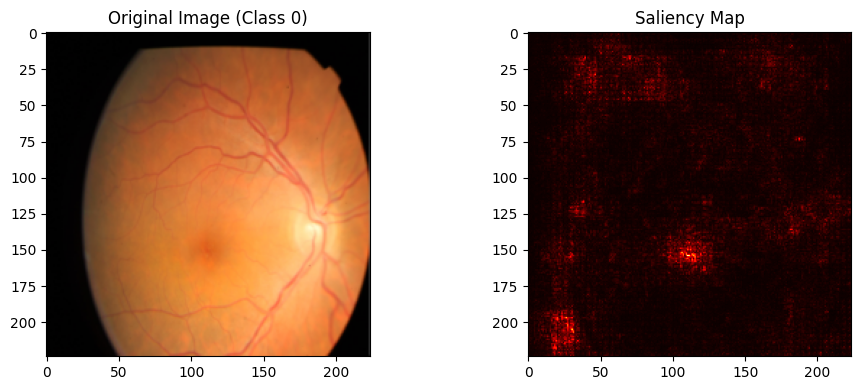

Class 1:


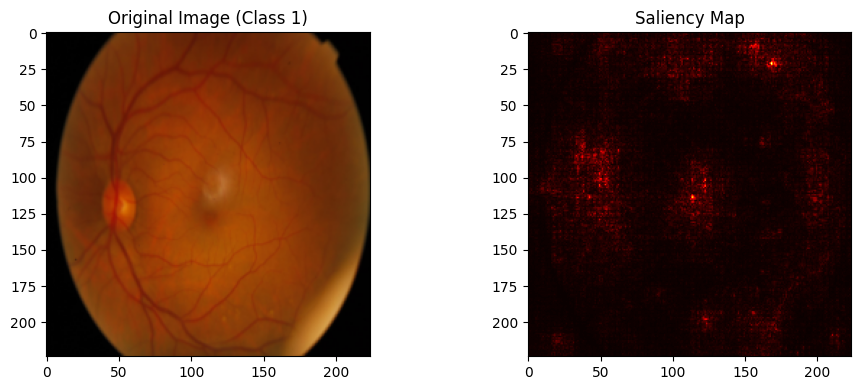

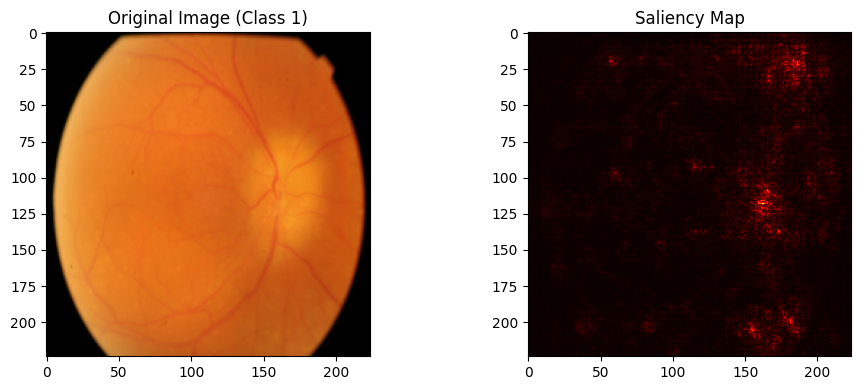

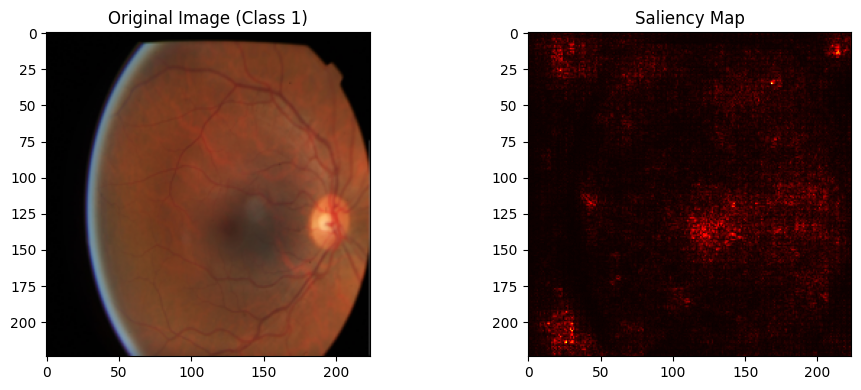

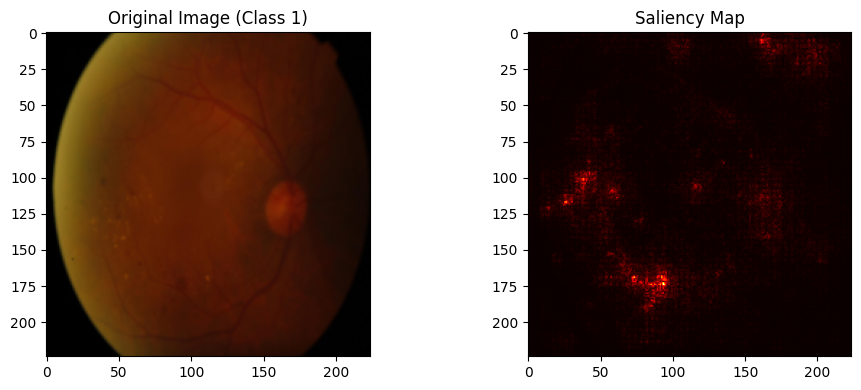

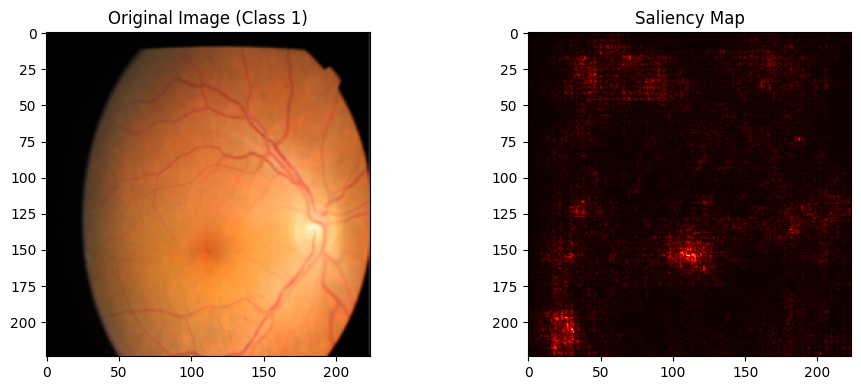

Class 2:


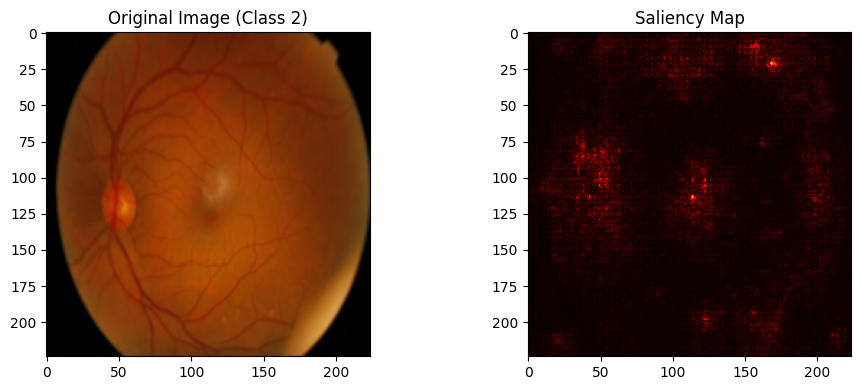

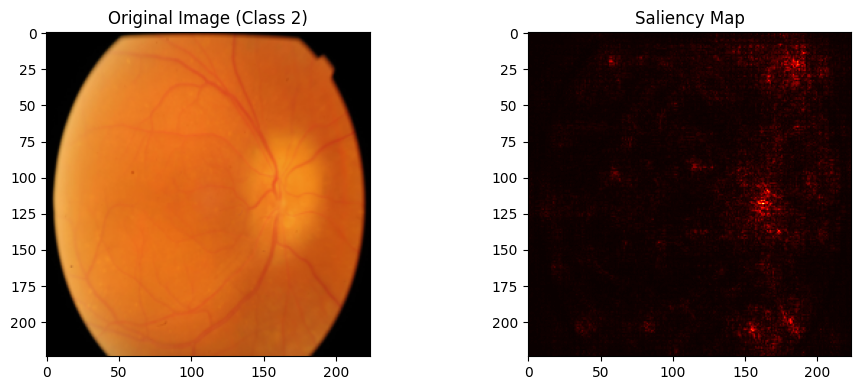

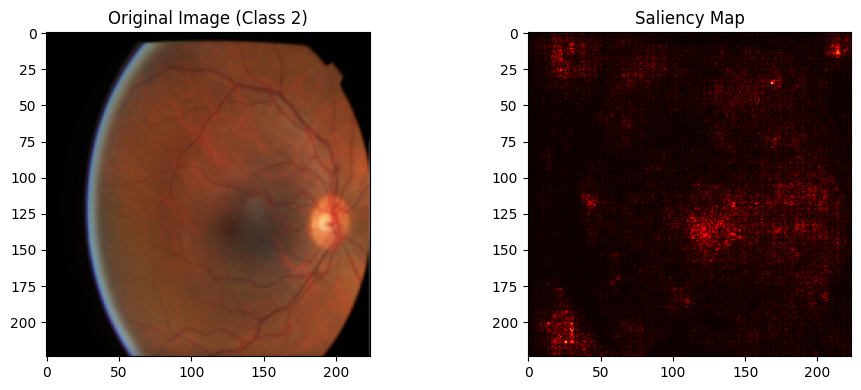

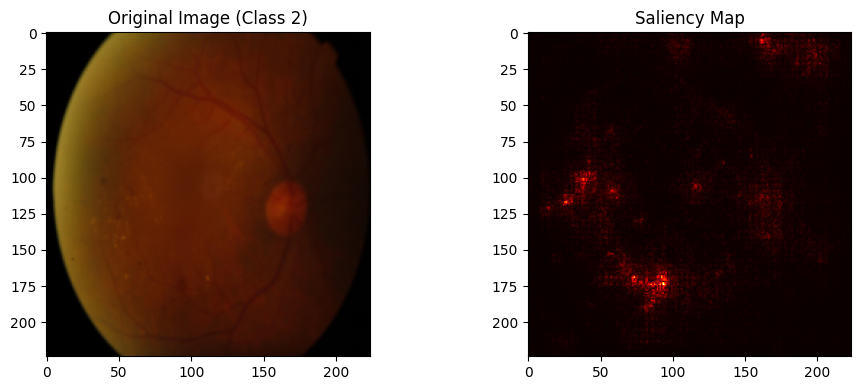

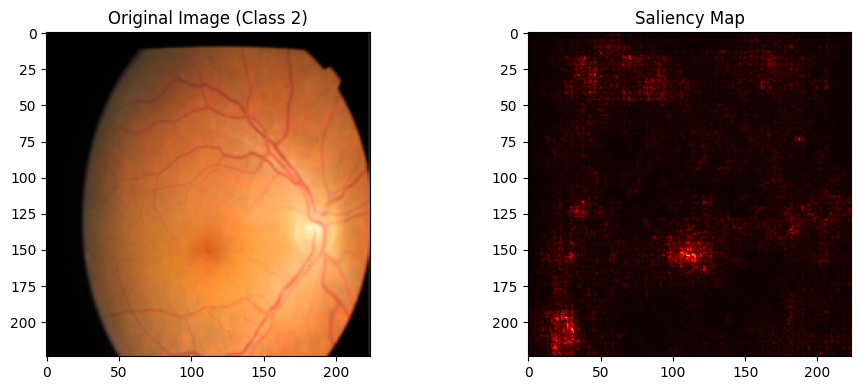

In [14]:
test(model, test_dataloader, saliency=True, device=device)

### Image quality assessment

In [15]:
# Good quality images
adequate_df = df_test[df_test['quality'] == 'Adequate']

# Bad quality images
inadequate_df = df_test[df_test['quality'] == 'Inadequate']

adequate_dataset = BRSETDataset(
    adequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

inadequate_dataset = BRSETDataset(
    inadequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

adequate_dataloader = DataLoader(adequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
inadequate_dataloader = DataLoader(inadequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

#### Adequate image quality

100%|██████████| 267/267 [01:14<00:00,  3.60it/s]


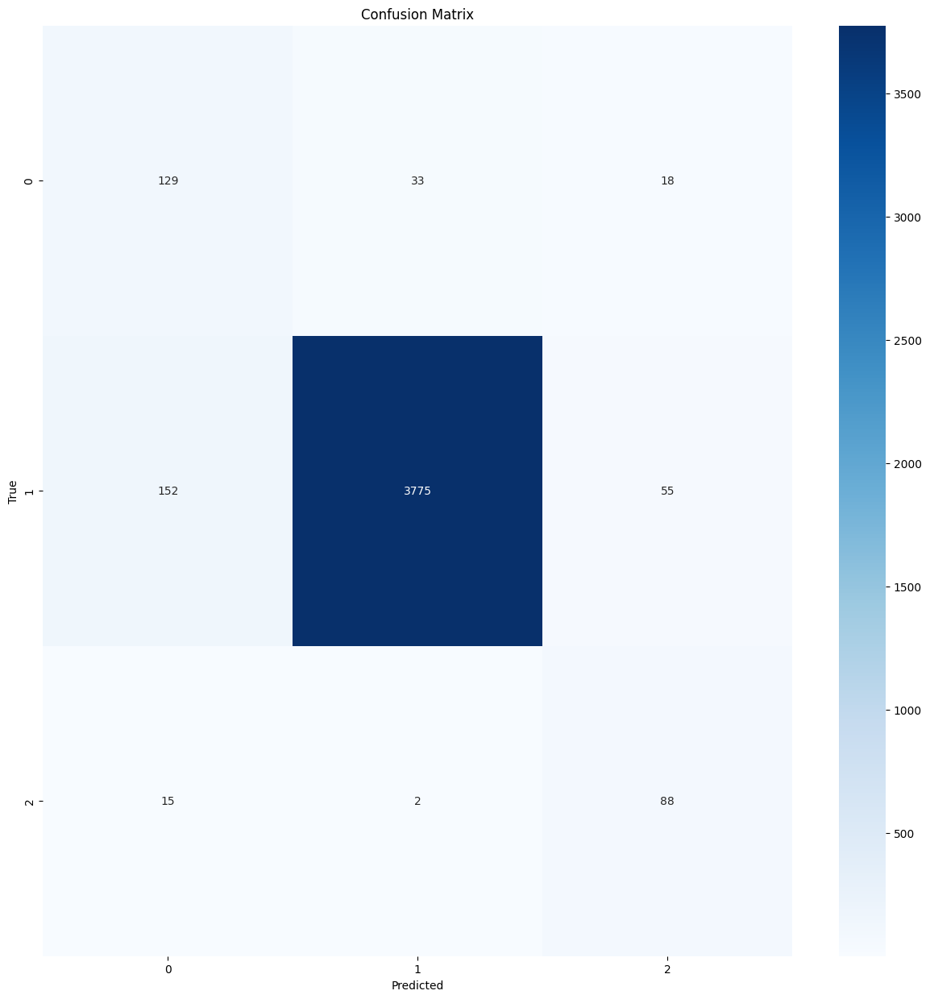

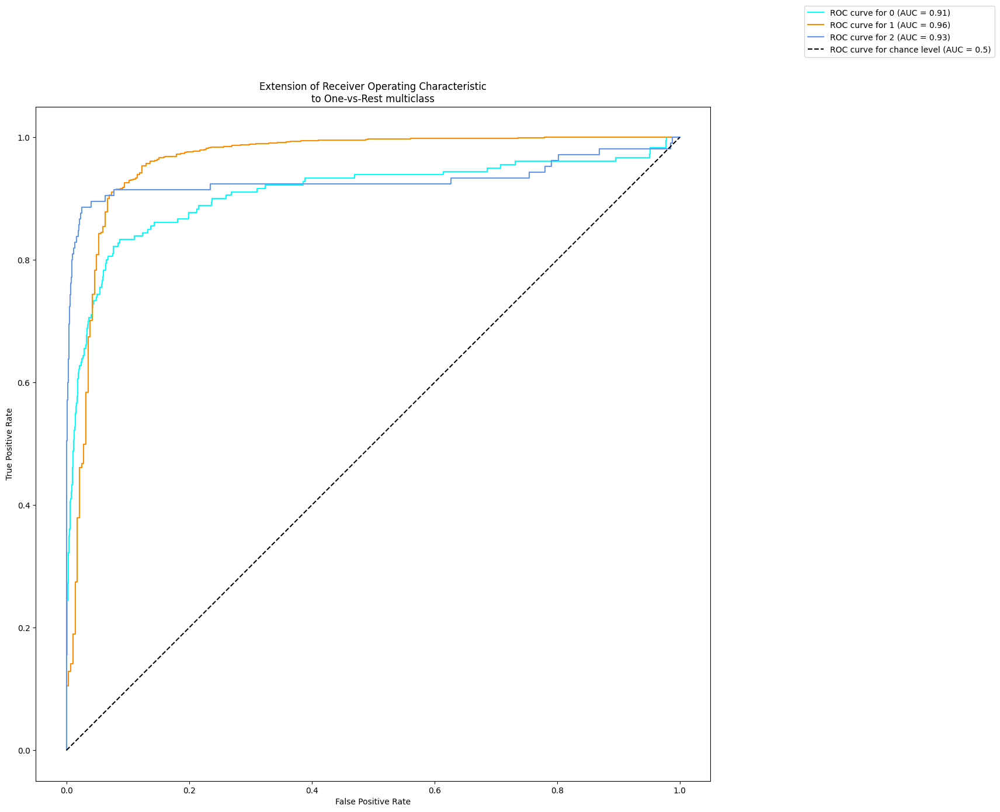

              precision    recall  f1-score   support

           0       0.44      0.72      0.54       180
           1       0.99      0.95      0.97      3982
           2       0.55      0.84      0.66       105

    accuracy                           0.94      4267
   macro avg       0.66      0.83      0.72      4267
weighted avg       0.96      0.94      0.94      4267

##################################################  Saliency Maps  ##################################################

Class 0:


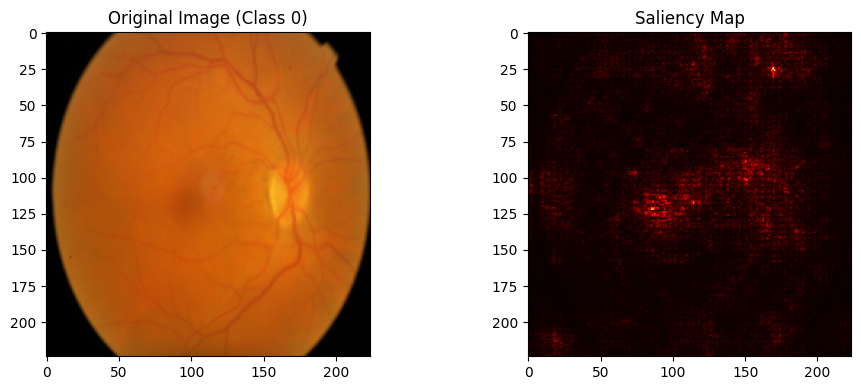

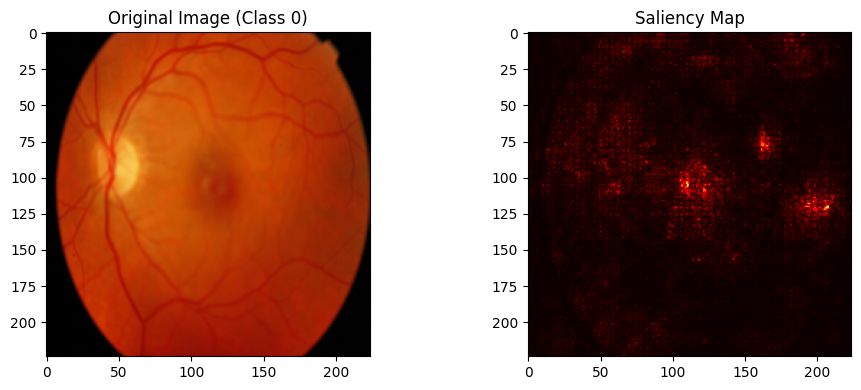

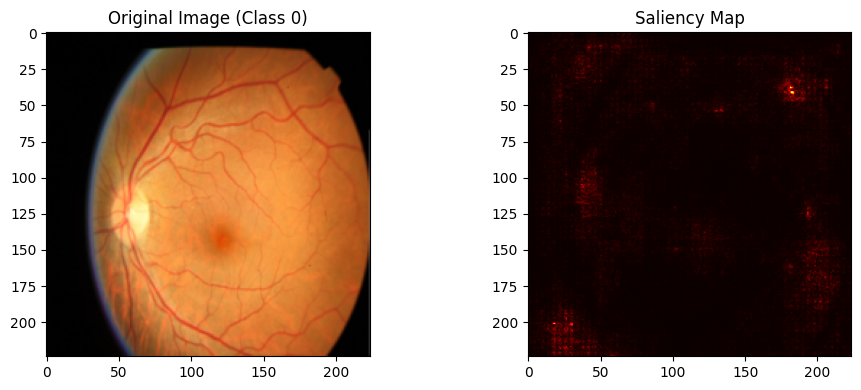

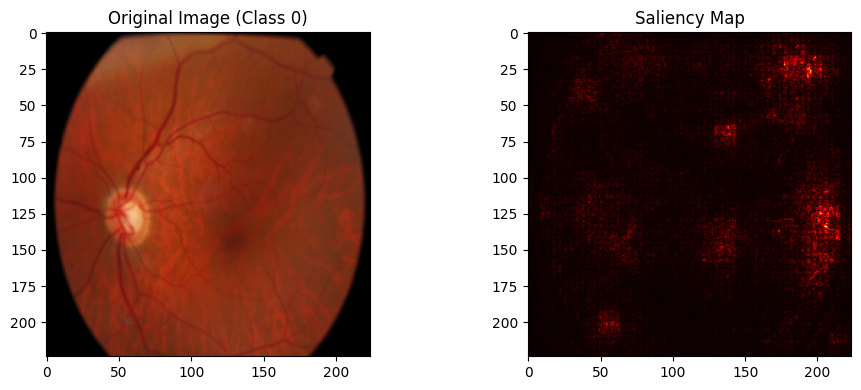

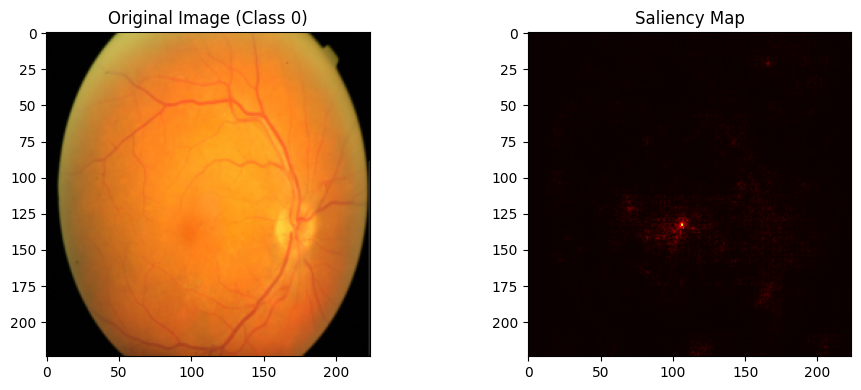

Class 1:


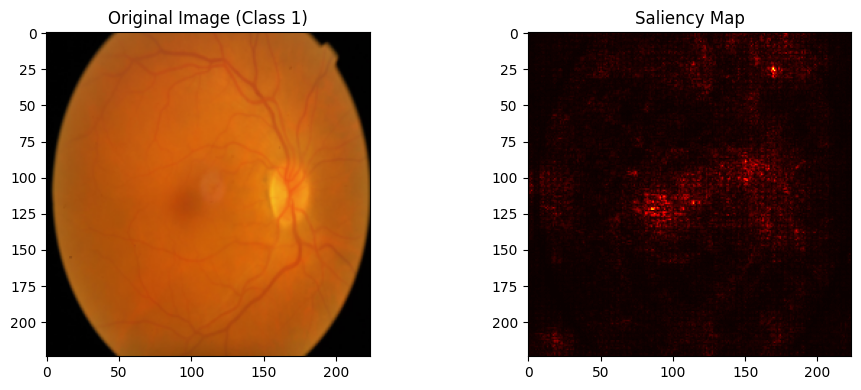

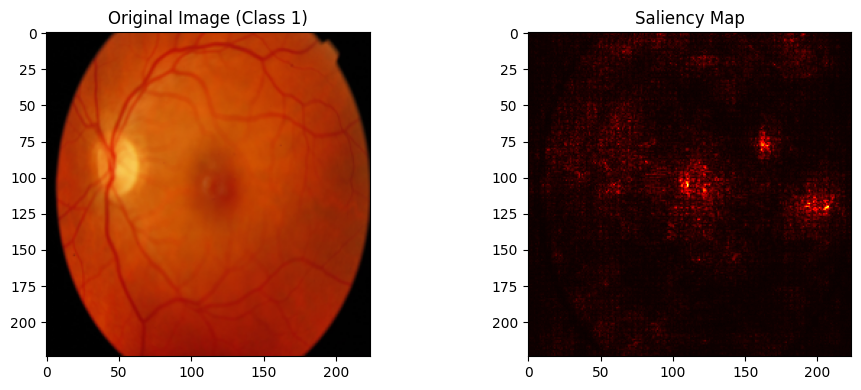

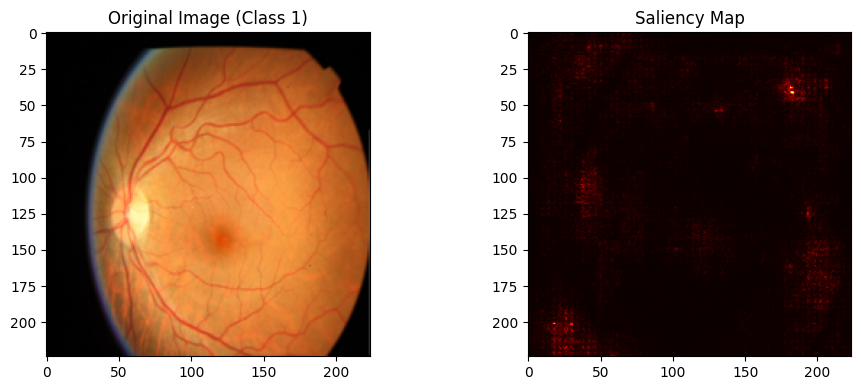

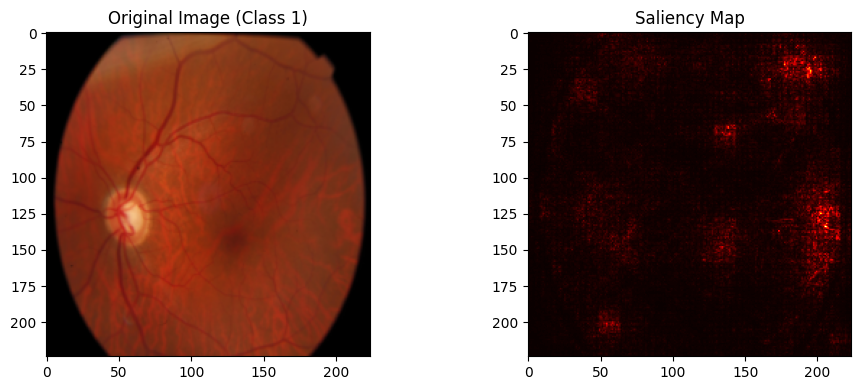

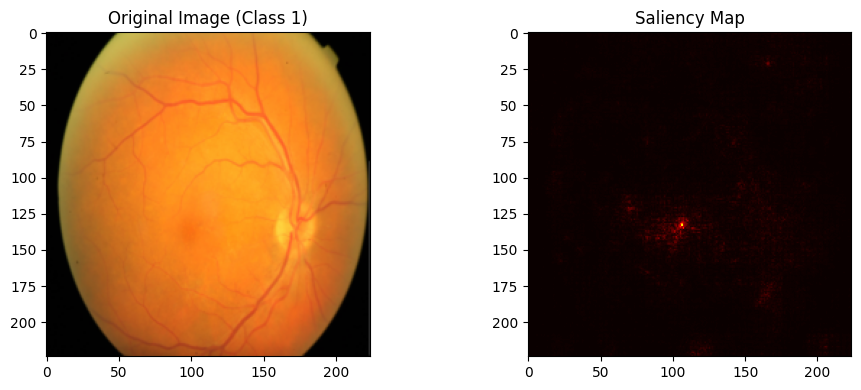

Class 2:


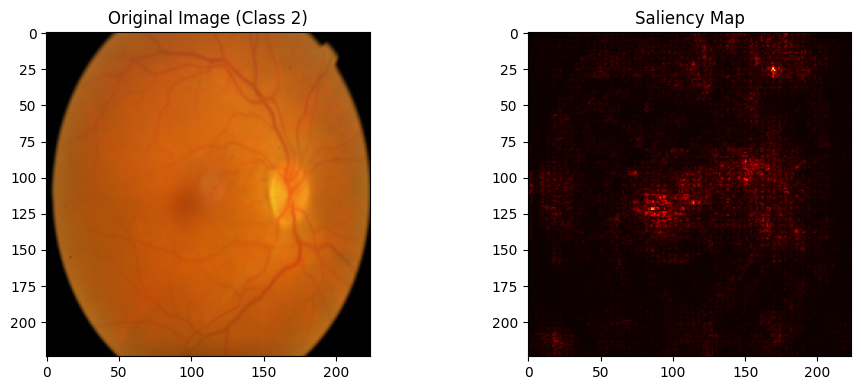

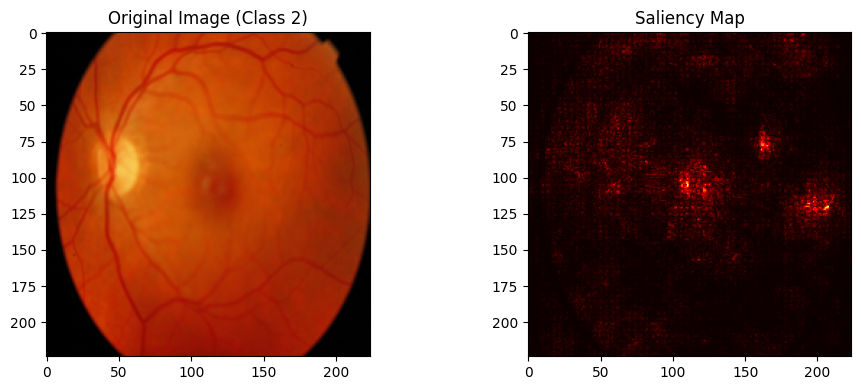

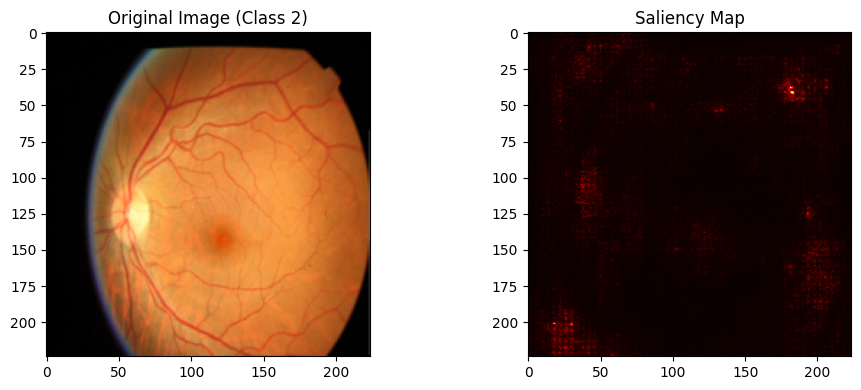

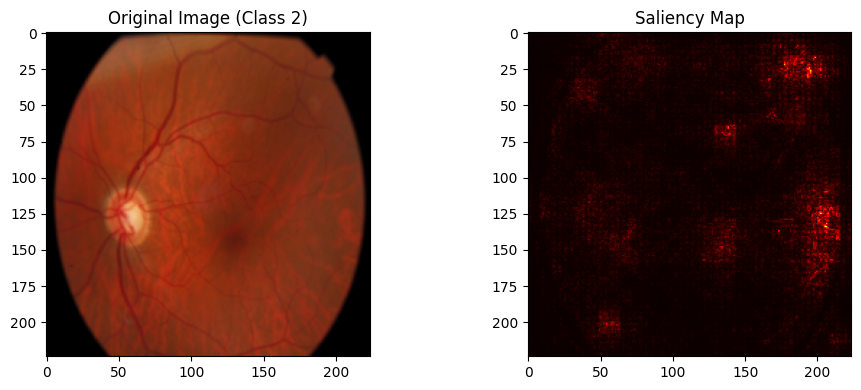

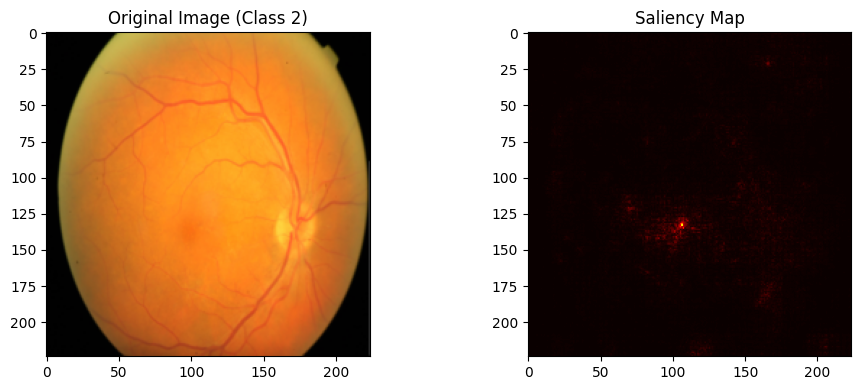

In [16]:
test(model, adequate_dataloader, saliency=True, device=device, save=True)

#### Inadequate image quality

100%|██████████| 39/39 [00:12<00:00,  3.22it/s]


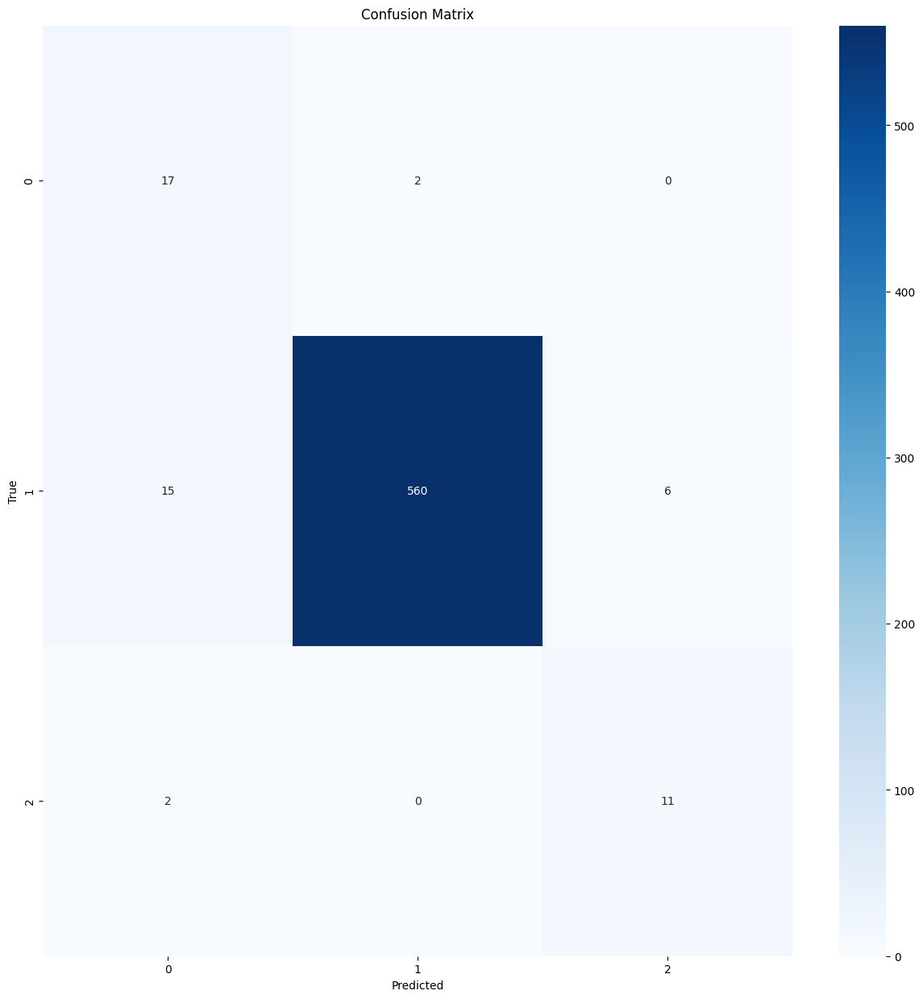

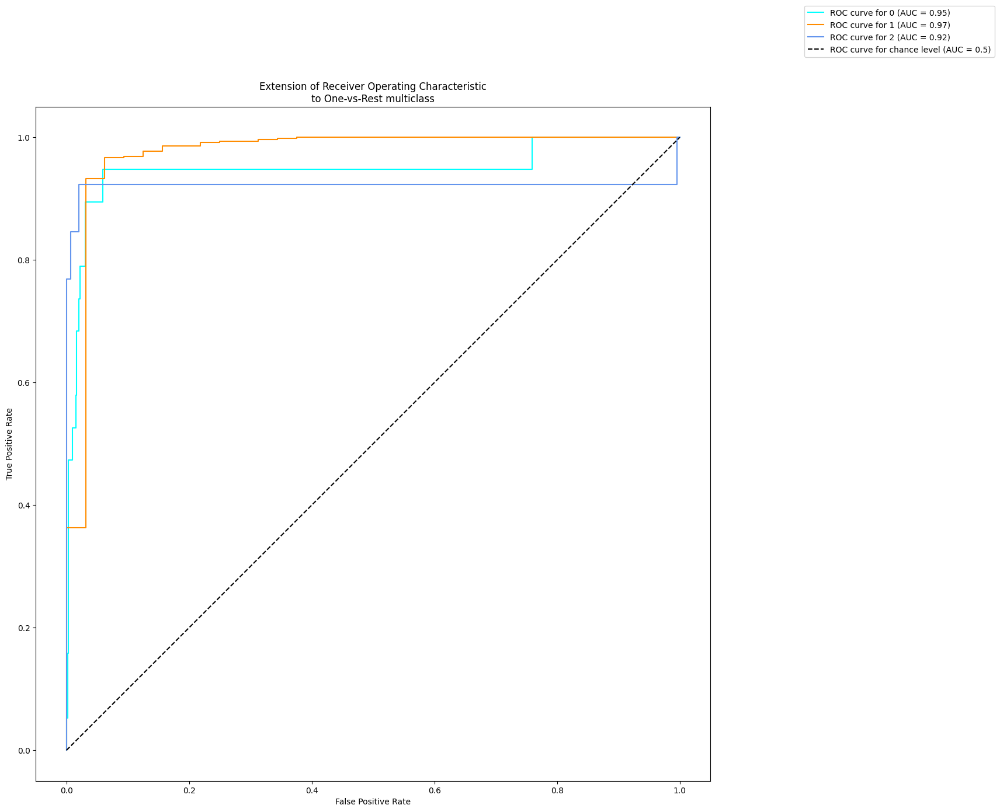

              precision    recall  f1-score   support

           0       0.50      0.89      0.64        19
           1       1.00      0.96      0.98       581
           2       0.65      0.85      0.73        13

    accuracy                           0.96       613
   macro avg       0.71      0.90      0.78       613
weighted avg       0.97      0.96      0.96       613

##################################################  Saliency Maps  ##################################################

Class 0:


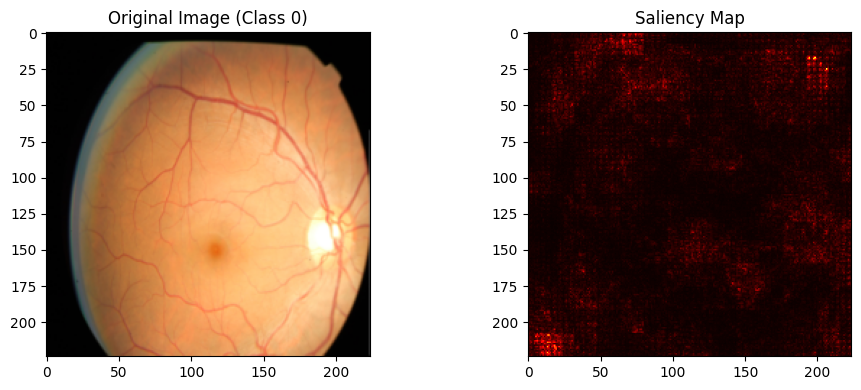

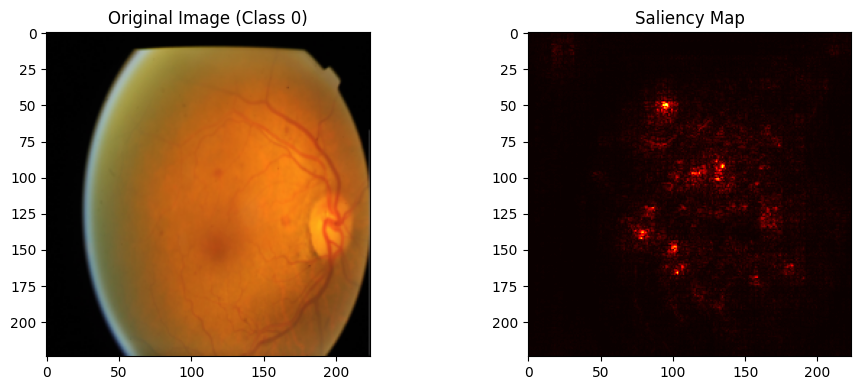

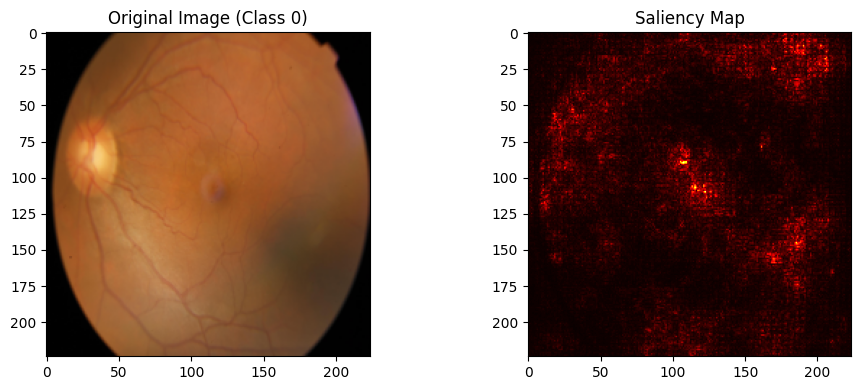

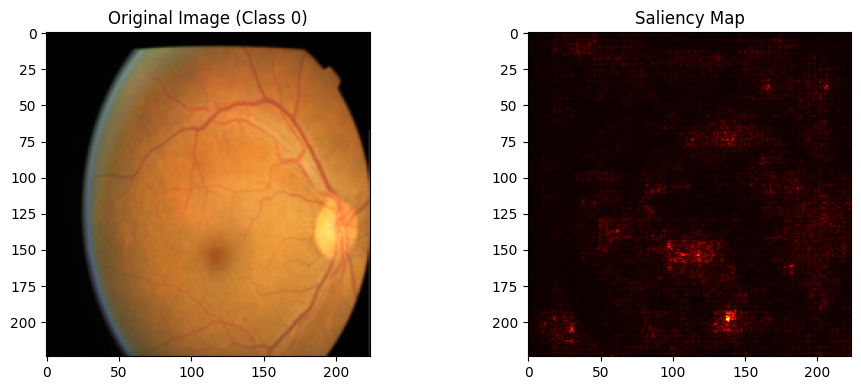

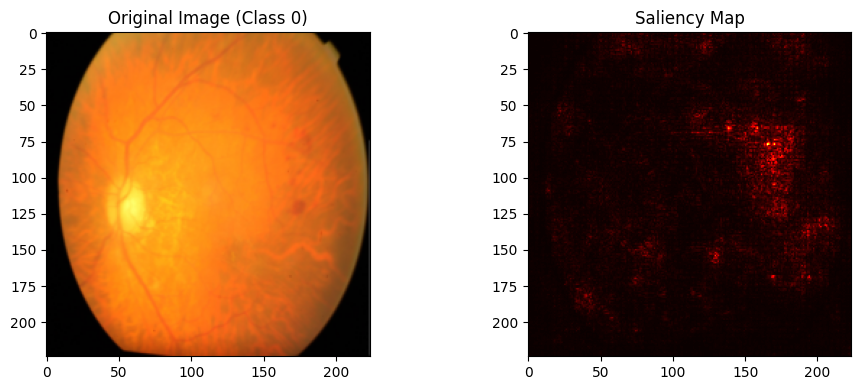

Class 1:


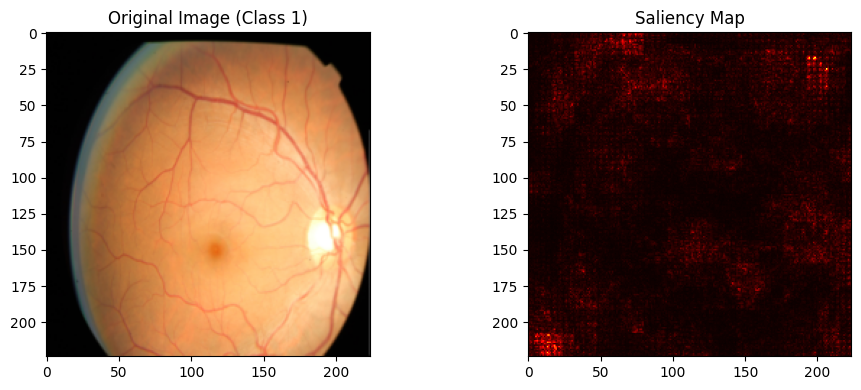

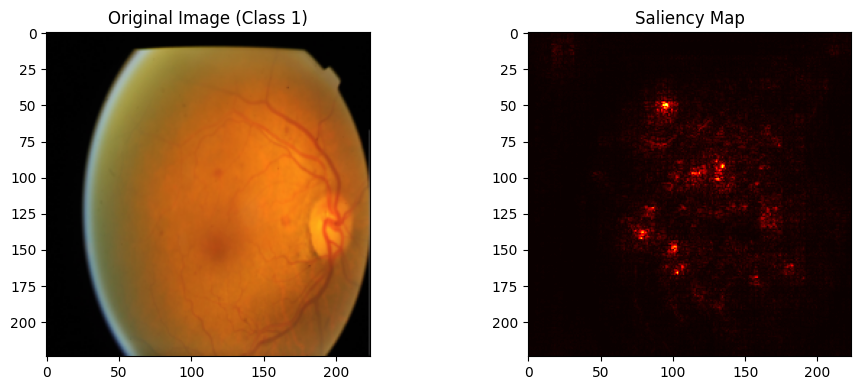

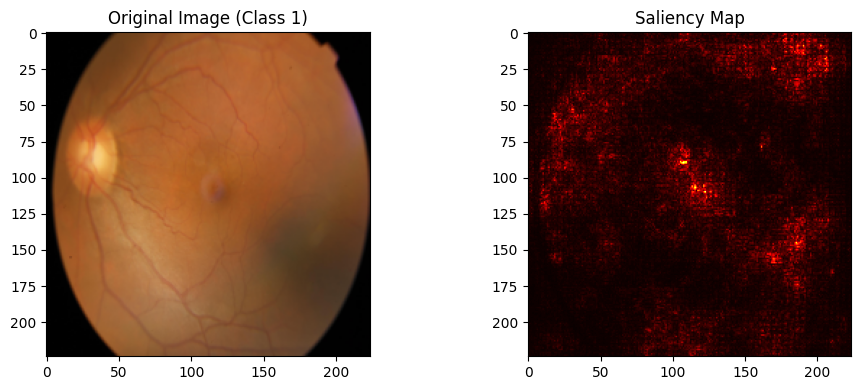

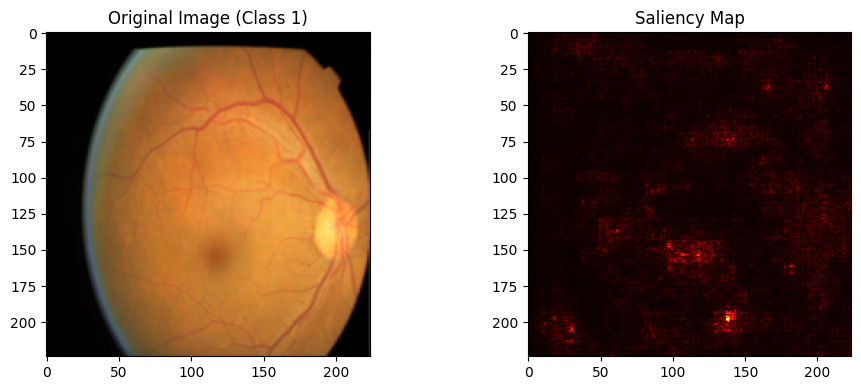

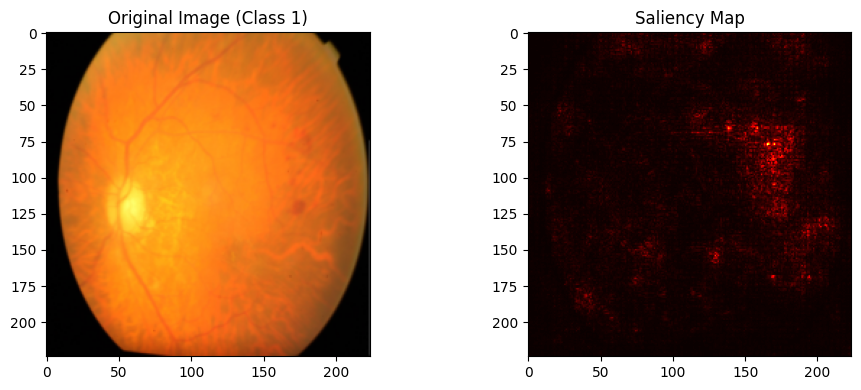

Class 2:


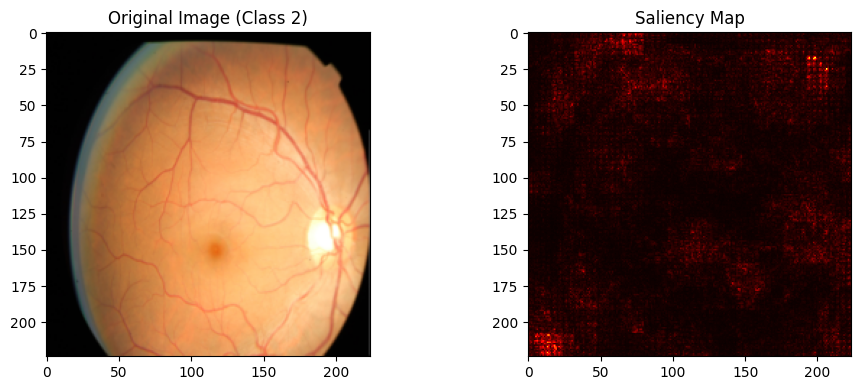

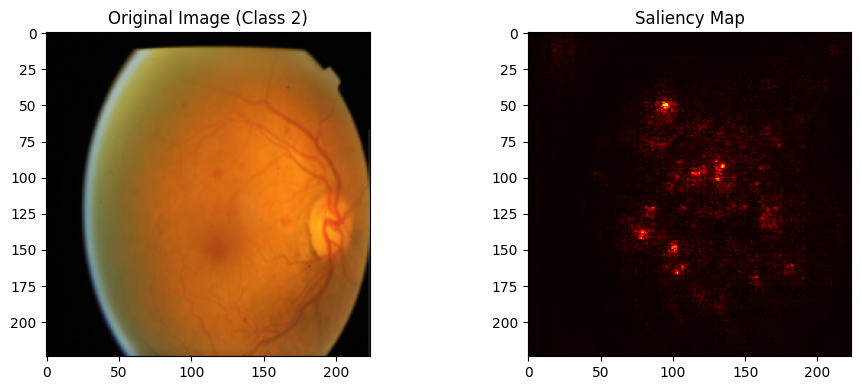

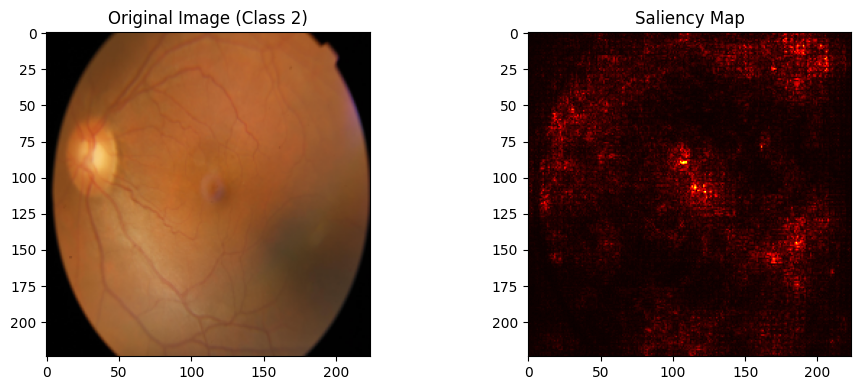

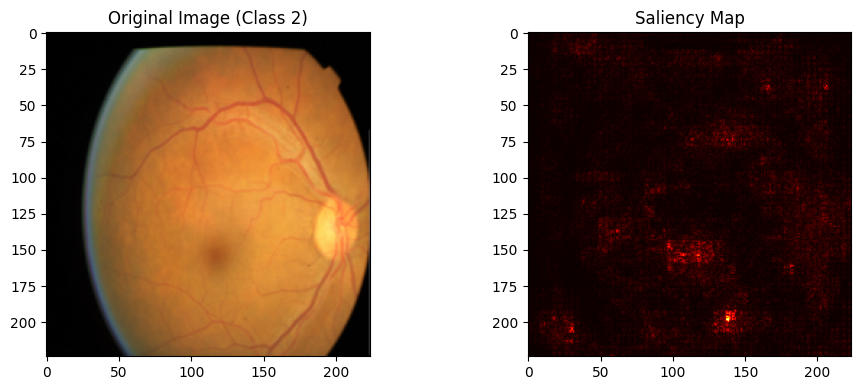

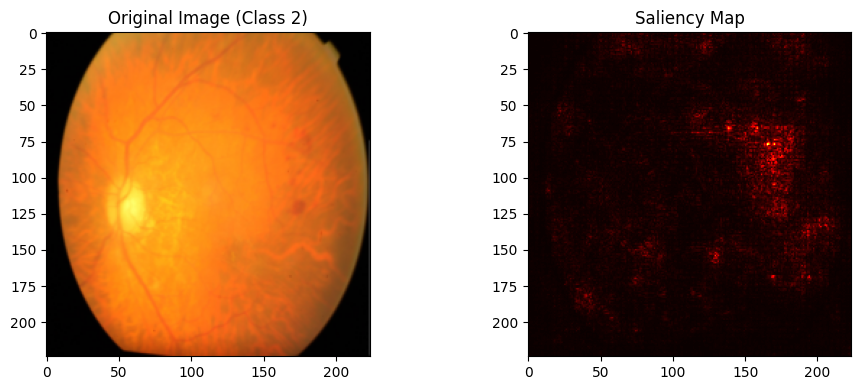

In [17]:
test(model, inadequate_dataloader, saliency=True, device=device)